In [ ]:
from google.colab import drive
drive.mount('/content/Mydrive')

Drive already mounted at /content/Mydrive; to attempt to forcibly remount, call drive.mount("/content/Mydrive", force_remount=True).


In [ ]:
import pandas as pd
df = pd.read_csv('/content/Mydrive/MyDrive/codestates/project/vgames2.csv')

In [ ]:
pd.set_option('display.max_rows', None)

In [ ]:
df.head(16598)

,Unnamed: 0,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales
0,1,Candace Kane's Candy Factory,DS,2008.0,Action,Destineer,0.04,0,0,0
1,2,The Munchables,Wii,2009.0,Action,Namco Bandai Games,0.17,0,0,0.01
2,3,Otome wa Oanesama Boku ni Koi Shiteru Portable,PSP,2010.0,Adventure,Alchemist,0,0,0.02,0
3,4,Deal or No Deal: Special Edition,DS,2010.0,Misc,Zoo Games,0.04,0,0,0
4,5,Ben 10 Ultimate Alien: Cosmic Destruction,PS3,2010.0,Platform,D3Publisher,0.12,0.09,0,0.04
5,6,Power Pro Kun Pocket 8,DS,2005.0,Sports,Konami Digital Entertainment,0,0,0.14,0
6,7,JASF: Jane's Advanced Strike Fighters,PC,2011.0,Simulation,Deep Silver,0.02,0.01,0,0
7,8,Samurai Warriors: State of War,PSP,2005.0,Action,Tecmo Koei,0.07,0,0.11,0.01
8,9,Imabikisou,PS3,2007.0,Adventure,Sega,0,0,0.04,0
9,10,The Penguins of Madagascar: Dr. Blowhole Retur...,PS3,2011.0,Action,THQ,0.04,0.03,0,0.01


In [ ]:
df.info()
## year의 결측치 없애고 object로 타입 변경

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16598 entries, 0 to 16597
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Unnamed: 0   16598 non-null  int64  
 1   Name         16598 non-null  object 
 2   Platform     16598 non-null  object 
 3   Year         16327 non-null  float64
 4   Genre        16548 non-null  object 
 5   Publisher    16540 non-null  object 
 6   NA_Sales     16598 non-null  object 
 7   EU_Sales     16598 non-null  object 
 8   JP_Sales     16598 non-null  object 
 9   Other_Sales  16598 non-null  object 
dtypes: float64(1), int64(1), object(8)
memory usage: 1.3+ MB


In [ ]:
df['Year'].fillna(0, inplace = True)
df = df.astype({'Year':'int'})
df = df.astype({'Year':'object'})

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16598 entries, 0 to 16597
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Unnamed: 0   16598 non-null  int64 
 1   Name         16598 non-null  object
 2   Platform     16598 non-null  object
 3   Year         16598 non-null  object
 4   Genre        16548 non-null  object
 5   Publisher    16540 non-null  object
 6   NA_Sales     16598 non-null  object
 7   EU_Sales     16598 non-null  object
 8   JP_Sales     16598 non-null  object
 9   Other_Sales  16598 non-null  object
dtypes: int64(1), object(9)
memory usage: 1.3+ MB


In [ ]:
df.isnull().sum()
## 우선 결측치가 발견된 2개 컬럼의 결측치를 null로 변경

Unnamed: 0      0
Name            0
Platform        0
Year            0
Genre          50
Publisher      58
NA_Sales        0
EU_Sales        0
JP_Sales        0
Other_Sales     0
dtype: int64

In [ ]:
df['Genre'].fillna('null', inplace = True)
df['Publisher'].fillna('null', inplace = True)

In [ ]:
df.isnull().sum()

Unnamed: 0     0
Name           0
Platform       0
Year           0
Genre          0
Publisher      0
NA_Sales       0
EU_Sales       0
JP_Sales       0
Other_Sales    0
dtype: int64

In [ ]:
# M, K를 포함하고 있는 행을 삭제해버림.
df = df[df['NA_Sales'].str.contains('M|K') == False]
df = df[df['EU_Sales'].str.contains('M|K') == False]
df = df[df['JP_Sales'].str.contains('M|K') == False]
df = df[df['Other_Sales'].str.contains('M|K') == False]

In [ ]:
df.shape #16598에서 15813으로 785개가 줄었음.

(15813, 10)

In [ ]:
df = df.reset_index(drop=True) #인덱스 재설정

In [ ]:
# sales(출고량) 관련 데이터는 object에서 float으로 변경
df = df.astype({'EU_Sales':'float'})
df = df.astype({'NA_Sales':'float'})
df = df.astype({'JP_Sales':'float'})
df = df.astype({'Other_Sales':'float'})

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15813 entries, 0 to 15812
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Unnamed: 0   15813 non-null  int64  
 1   Name         15813 non-null  object 
 2   Platform     15813 non-null  object 
 3   Year         15813 non-null  object 
 4   Genre        15813 non-null  object 
 5   Publisher    15813 non-null  object 
 6   NA_Sales     15813 non-null  float64
 7   EU_Sales     15813 non-null  float64
 8   JP_Sales     15813 non-null  float64
 9   Other_Sales  15813 non-null  float64
dtypes: float64(4), int64(1), object(5)
memory usage: 1.2+ MB


In [ ]:
df.duplicated().sum() ##중복데이터 없음

0

#### 1) 지역에 따라서 선호하는 게임 장르가 다를까
###### -지역 구분 : 북미, 유럽, 일본, 기타지역
###### -지역별로 선호하는 게임의 장르 
######: 일본 지역을 제외하고 action, sports, shooter로 동일 / 일본은 action, sports, role-playing
###### -지역별로 선호하는 게임의 장르가 같은지 다른지와 그 이유   
###### : 지역별로 선호하는 게임의 장르 top3를 뽑아본 결과, 일본을 제외하고는 모두 동일했다. 일본도 1개만 달랐다. 때문에 지역별로 선호하는 게임의 장르가 거의 동일하다고 할 수 있다.

###### - 북미 지역의 특성 확인
###### : Action, Sports, Shooter

In [ ]:
df.groupby('Genre')['NA_Sales'].sum()

Genre
Action          819.77
Adventure       101.62
Fighting        213.60
Misc            393.89
Platform        414.80
Puzzle          120.19
Racing          337.65
Role-Playing    296.32
Shooter         551.62
Simulation      175.56
Sports          648.23
Strategy         66.55
null             14.86
Name: NA_Sales, dtype: float64

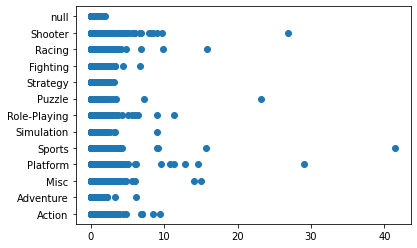

In [ ]:
import matplotlib.pyplot as plt
plt.scatter(df['NA_Sales'],df['Genre'])
plt.show()

######- 일본지역의 특성 확인
######: Role-Playing, Action, Sports

In [ ]:
df.groupby('Genre')['JP_Sales'].sum()

Genre
Action          152.00
Adventure        49.36
Fighting         83.15
Misc            101.03
Platform        123.31
Puzzle           56.84
Racing           51.58
Role-Playing    322.85
Shooter          37.29
Simulation       61.75
Sports          127.44
Strategy         44.34
null              8.54
Name: JP_Sales, dtype: float64

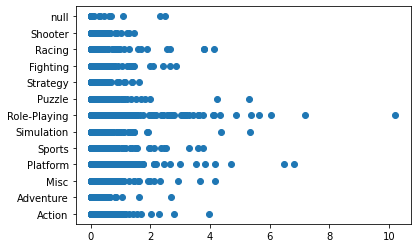

In [ ]:
import matplotlib.pyplot as plt
plt.scatter(df['JP_Sales'],df['Genre'])
plt.show()

######- 유럽지역의 특성 확인
######: Action, Sports, Shooter

In [ ]:
df.groupby('Genre')['EU_Sales'].sum()

Genre
Action          495.89
Adventure        61.38
Fighting         95.68
Misc            204.75
Platform        186.21
Puzzle           50.26
Racing          225.46
Role-Playing    167.37
Shooter         296.84
Simulation      107.64
Sports          356.53
Strategy         43.73
null              8.85
Name: EU_Sales, dtype: float64

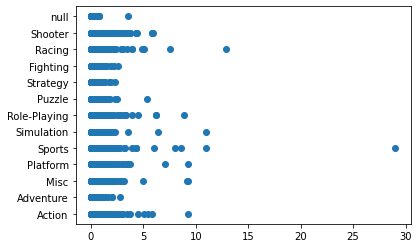

In [ ]:
import matplotlib.pyplot as plt
plt.scatter(df['EU_Sales'],df['Genre'])
plt.show()

######- 그 외 지역의 특성 확인
######: Action, Sports, Shooter

In [ ]:
df.groupby('Genre')['Other_Sales'].sum()

Genre
Action          178.77
Adventure        16.23
Fighting         34.87
Misc             71.46
Platform         48.22
Puzzle           12.26
Racing           74.32
Role-Playing     53.11
Shooter          97.81
Simulation       29.73
Sports          128.96
Strategy         10.87
null              4.72
Name: Other_Sales, dtype: float64

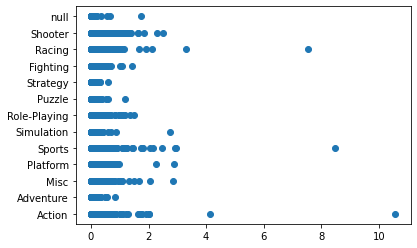

In [ ]:
import matplotlib.pyplot as plt
plt.scatter(df['Other_Sales'],df['Genre'])
plt.show()

#### 2) 연도별 게임의 트렌드가 있을까
###### -트렌드를 파악한 기준 
######: 80, 90, 00, 10년대로 기간을 나누어 단위기간별로 장르별 total_sales를 구하고 시각화해 트렌드를 파악한다.
###### -연도별 트렌드가 존재하는가
######: 80년대는 Platform, Puzzle, Shooter / 90년대는 Platform, Roleplaying, Sports / 00년대는 Action, Sports / 10년대는 Action, Shooter, Sports가 인기가 많았다. 어느정도 트렌드 있다고 생각함.
###### -왜 트렌드가 존재한다고/존재하지 않는다고 생각했는가   
###### : 80-90년대 platform, 90년대부터 sports 인기 이어짐. 00-10에는 Action, Shooter인기

In [ ]:
df['total_sales'] = df['NA_Sales'] + df['EU_Sales'] + df['JP_Sales'] + df['Other_Sales']

In [ ]:
df = df.astype({'Year':'int'})

In [ ]:
idx = df[df['Year'] < 100].index
df.drop(idx, inplace=True)

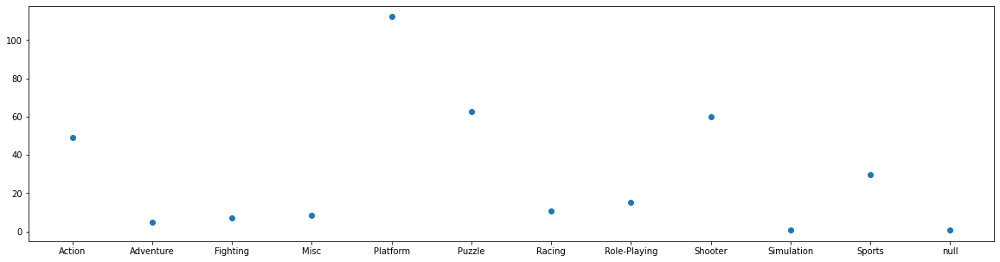

In [ ]:
#80년대 : Platform, Puzzle, Shooter
data_1 = df.loc[(df['Year'] >= 1980) & (df['Year'] < 1990)].groupby('Genre')['total_sales'].sum()
data_1 = pd.DataFrame(data_1)
data_1 = data_1.reset_index()
plt.figure(figsize=(20, 5))
plt.scatter(data_1['Genre'],data_1['total_sales'])
plt.show()

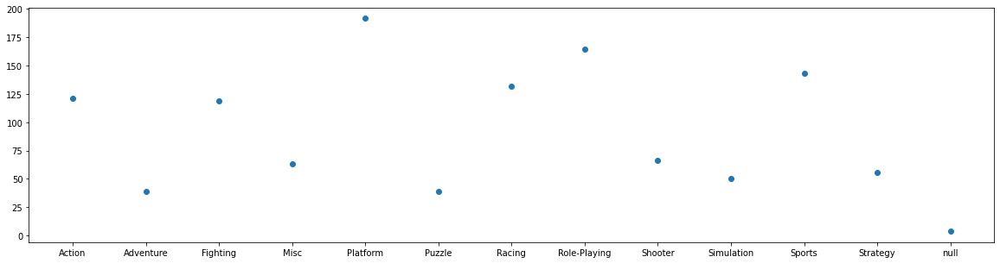

In [ ]:
#90년대 : Platform, Roleplaying, Sports
data_2 = df.loc[(df['Year'] >= 1990) & (df['Year'] < 2000)].groupby('Genre')['total_sales'].sum()
data_2 = pd.DataFrame(data_2)
data_2 = data_2.reset_index()
plt.figure(figsize=(20, 5))
plt.scatter(data_2['Genre'],data_2['total_sales'])
plt.show()

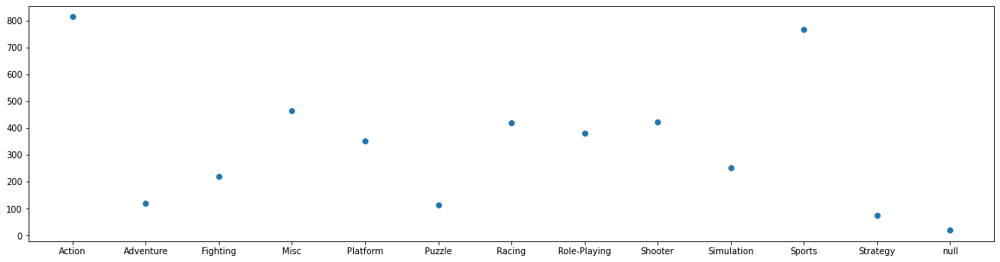

In [ ]:
##00년대 : Action, Sports
data_3 = df.loc[(df['Year'] >= 2000) & (df['Year'] < 2010)].groupby('Genre')['total_sales'].sum()
data_3 = pd.DataFrame(data_3)
data_3 = data_3.reset_index()
plt.figure(figsize=(20, 5))
plt.scatter(data_3['Genre'],data_3['total_sales'])
plt.show()

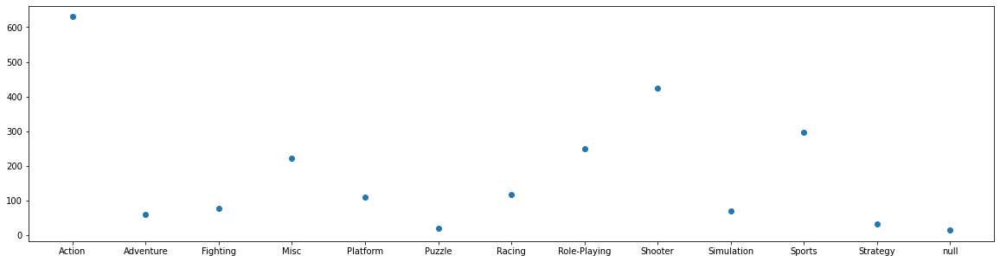

In [ ]:
##10년대 : Action, Shooter, Sports
data_4 = df.loc[(df['Year'] >= 2010) & (df['Year'] <= 2017)].groupby('Genre')['total_sales'].sum()
data_4 = pd.DataFrame(data_4)
data_4 = data_4.reset_index()
plt.figure(figsize=(20, 5))
plt.scatter(data_4['Genre'],data_4['total_sales'])
plt.show()

#### 3) 인기가 많은 게임에 대한 분석 및 시각화
###### - 인기가 많다는 것을 어떻게 정의
######: 00-10년대 기간동안 장르별 total_sales비교 / 00년대와 10년대 따로도 살펴봄
###### - 해당 게임이 왜 인기가 많은지
######: Action, Sports, Shooter 순으로 00-10년대 장르별 total_sales가 높았가 때문. 00년대와 10을 비교해 살펴보았을 때, shooter만 수치가 증가한 것을 확인할 수 있음.
###### - 시각화로 무엇을 나타내려 했는지
###### :00-10년대 장르별 total_sales 시각화. 가로축이 장르, 세로축이 total_sales를 나타냄. 00년대와 10년대를 따로도 볼 수 있도록 함.
###### - 이러한 분석으로 어떤 인사이트 도출이 가능한지
###### : 최근(00, 10년대)에 어떤 게임이 인기가 많았는지? 00년대에서 10년대 사이에 어떤 변화가 있었는지? 따라서 다음에 어떤 게임을 설계해야하는지 생각해볼 수 있음.

In [ ]:
##00-10의 장르별 total_sales 합한 결과 Action, Sports, Shooter 순으로 인기 많음.
total_sales_2 = data_3['total_sales']
data_4['total_sales_2'] = total_sales_2
data_4['total'] = data_4['total_sales'] + data_4['total_sales_2']
data_4 = data_4.sort_values(by=["total"], ascending=False) 
data_4

,Genre,total_sales,total_sales_2,total
0,Action,630.25,814.24,1444.49
10,Sports,295.77,767.91,1063.68
8,Shooter,423.27,421.68,844.95
3,Misc,222.07,464.40,686.47
7,Role-Playing,249.77,379.58,629.35
6,Racing,117.42,421.16,538.58
4,Platform,109.41,351.64,461.05
9,Simulation,70.14,251.15,321.29
2,Fighting,76.61,219.33,295.94
1,Adventure,59.85,119.59,179.44


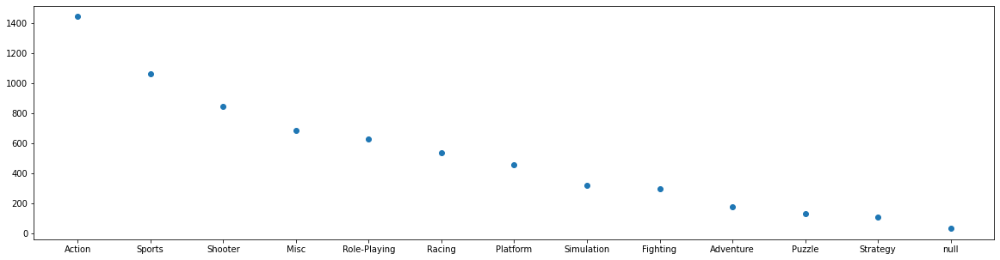

In [ ]:
#전체
plt.figure(figsize=(20, 5))
plt.scatter(data_4['Genre'],data_4['total'])
plt.show()

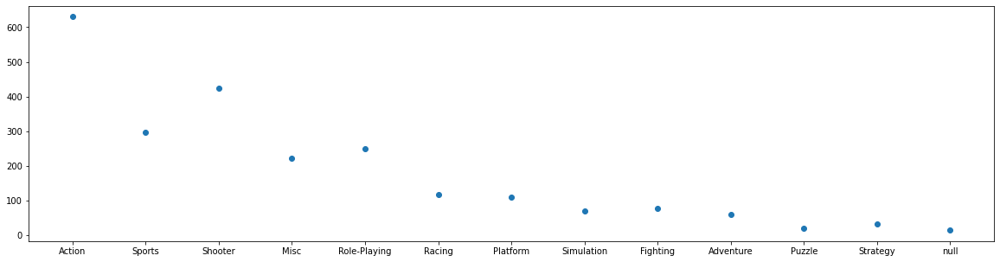

In [ ]:
#10년대
plt.figure(figsize=(20, 5))
plt.scatter(data_4['Genre'],data_4['total_sales'])
plt.show()

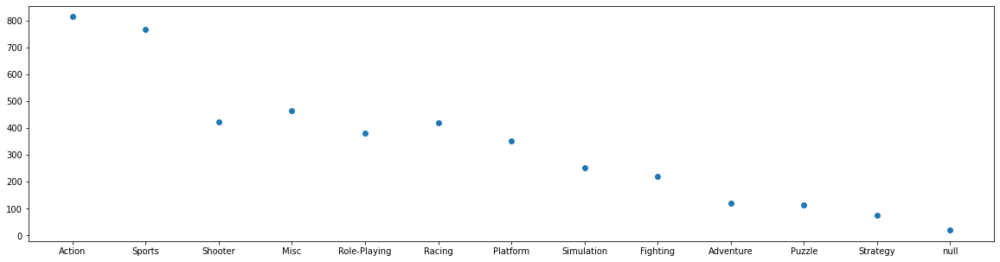

In [ ]:
#00년대
plt.figure(figsize=(20, 5))
plt.scatter(data_4['Genre'],data_4['total_sales_2'])
plt.show()

In [ ]:
# 10에서 00을 빼서 변화 정도를 파악해볼 수 있음.
data_4['diff'] = data_4['total_sales'] - data_4['total_sales_2']
data_4

,Genre,total_sales,total_sales_2,total,diff
0,Action,630.25,814.24,1444.49,-183.99
10,Sports,295.77,767.91,1063.68,-472.14
8,Shooter,423.27,421.68,844.95,1.59
3,Misc,222.07,464.40,686.47,-242.33
7,Role-Playing,249.77,379.58,629.35,-129.81
6,Racing,117.42,421.16,538.58,-303.74
4,Platform,109.41,351.64,461.05,-242.23
9,Simulation,70.14,251.15,321.29,-181.01
2,Fighting,76.61,219.33,295.94,-142.72
1,Adventure,59.85,119.59,179.44,-59.74


#### 4) 다음 분기에 어떤 게임을 설계해야 하는지
######: shooter